In [3]:
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/My Drive/4211_Project/MvTec/bottle/'  

#path = '/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import tensorflow as tf
from keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Dense, UpSampling2D, ZeroPadding2D, Flatten
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras import Model
from keras.optimizers import Adam#, RMSprop
import os
import random
import numpy as np
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
import cv2

Using TensorFlow backend.


### Data check - Print raw sample image 

Raw image dimension: 
(900, 900, 3)


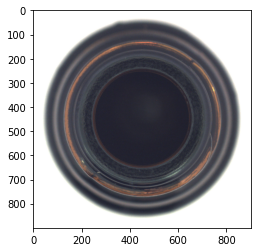

In [5]:
sample_raw = imread(path+'train/good/000.png')
plt.imshow(sample_raw)
print("Raw image dimension: ")
print(sample_raw.shape)

### Define image size and paths for preprocessing

In [0]:
IMG_H, IMG_W, IMG_C = 227,227,1

TRAIN_PATH = path+'train/good/'
train_ids = next(os.walk(TRAIN_PATH))[2]

TEST_PATH = path+'test/'
test_folders = next(os.walk(TEST_PATH))[1]

MASK_PATH = path+'ground_truth/'
mask_folders = test_folders.copy()
mask_folders.remove('good')

### Preprocessing 
- Load images from local file
- Resize images to 227 x 227

In [7]:
X_color, y_bad_color, y_good_color, mask = [],[],[],[]

for id in train_ids:
    path = TRAIN_PATH + id
    img = imread(path)
    img = resize(img, (IMG_H, IMG_W), mode='constant', preserve_range=True)
    X_color.append(img)

for folder in test_folders:
    folder_path = TEST_PATH+folder
    for id in sorted(next(os.walk(folder_path))[2]):
        img = imread(folder_path+'/'+id)
        img = resize(img, (IMG_H, IMG_W), mode='constant', preserve_range=True)
        if folder == 'good':
            y_good_color.append(img)
        else:
            y_bad_color.append(img)

for folder in mask_folders:
    folder_path = MASK_PATH+folder
    for id in sorted(next(os.walk(folder_path))[2]):
        img = imread(folder_path+'/'+id)
        img = resize(img, (IMG_H, IMG_W), mode='constant', preserve_range=True)
        mask.append(img)

X_color = np.asarray(X_color)
y_good_color = np.asarray(y_good_color)
y_bad_color = np.asarray(y_bad_color)
mask = np.asarray(mask)

print("Training data Sanity check: ", np.shape(X_color))
print("Normal testing data Sanity check: ",np.shape(y_good_color))
print("Anomalous testing data Sanity check: ",np.shape(y_bad_color))
print("Anomaly masks for testing Sanity check: ",np.shape(mask))

Training data Sanity check:  (212, 227, 227, 3)
Normal testing data Sanity check:  (24, 227, 227, 3)
Anomalous testing data Sanity check:  (63, 227, 227, 3)
Anomaly masks for testing Sanity check:  (63, 227, 227)


In [0]:
# Helper function for changing color images to grayscale

def to_grayscale(imgs):
    imgs_gray = np.zeros(imgs.shape[:-1])
    for i in range(len(imgs)): 
        imgs_gray[i] = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2GRAY)
    #imgs_gray = np.stack((imgs_gray,imgs_gray,imgs_gray), axis=-1)
    imgs_gray = imgs_gray[:,:,:,np.newaxis]
    return imgs_gray

### Preprocessing 
- SSIM Loss operates on grayscale; change color images to grayscale
- Normalize (0-225) images to (0-1) for efficient training

In [0]:
X_color = np.asarray(X_color)
y_good_color = np.asarray(y_good_color)
y_bad_color = np.asarray(y_bad_color)
mask = np.asarray(mask)

X=to_grayscale(X_color.astype('uint8'))
y_bad=to_grayscale(y_bad_color.astype('uint8'))
y_good=to_grayscale(y_good_color.astype('uint8'))

X = X.astype('float32') / 255.0 
y_good = y_good.astype('float32') / 255.0 
y_bad = y_bad.astype('float32') / 255.0 

### Data check - Print processed sample image

Processed image dimension: 
(227, 227)


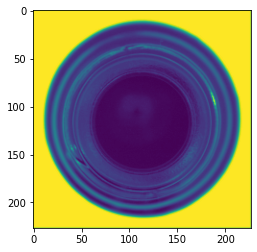

In [10]:
sample_processed = X[0].reshape(IMG_H, IMG_W)
plt.imshow(sample_processed)
print("Processed image dimension: ")
print(sample_processed.shape)

### Architecture
- Enoder: Alex-Net without the dense layers 
- Decode: Reversed version of the encoder

In [0]:
inputs = Input((IMG_H, IMG_W, IMG_C))
#inputs = Lambda(lambda x:x/255)(inputs)

#-------------------Contraction-----------------------

c1 = Conv2D(96, (11, 11), strides=4 , activation='relu', padding='valid')(inputs)
m1 = MaxPooling2D((3,3), strides=2)(c1)

c2 = ZeroPadding2D(padding=(2,2))(m1)
c2 = Conv2D(256, (5, 5), strides=1, activation='relu', padding='valid')(c2)
m2 = MaxPooling2D((3,3), strides=2)(c2)

c3 = ZeroPadding2D(padding=(1,1))(m2)
c3 = Conv2D(384, (3, 3), strides=1, activation='relu', padding='valid')(c3)

c4 = ZeroPadding2D(padding=(1,1))(c3)
c4 = Conv2D(384, (3, 3), strides=1, activation='relu', padding='valid')(c4)

c5 = ZeroPadding2D(padding=(1,1))(c4)
c5 = Conv2D(256, (3, 3), strides=1, activation='relu', padding='valid')(c5)
m5 = MaxPooling2D((3,3), strides=2)(c5)

f = Flatten()(m5)
d = Dense(2048, activation = 'relu')(m5)

#---------------------Expansion------------------------

em6 = Conv2DTranspose(256, (3, 3), strides=2)(d)
e6 = Conv2D(256, (3, 3), strides=1, activation='relu', padding='valid')(em6)
e6 = ZeroPadding2D(padding=(1,1))(e6)

e7 = Conv2D(384, (3, 3), strides=1, activation='relu', padding='valid')(e6)
e7 = ZeroPadding2D(padding=(1,1))(e7)

e8 = Conv2D(384, (3, 3), strides=1, activation='relu', padding='valid')(e7)
e8 = ZeroPadding2D(padding=(1,1))(e8)

em9 = Conv2DTranspose(256, (3, 3), strides=2)(e8)
e9 = Conv2D(256, (5, 5), strides=1, activation='relu', padding='valid')(em9)
e9 = ZeroPadding2D(padding=(2,2))(e9)

em10 = Conv2DTranspose(96, (3, 3), strides=2)(e9)

e10 = Conv2DTranspose(96, (11, 11), strides=4)(em10)
e10 = Conv2D(96, (11, 11), strides=4 , activation='relu', padding='valid')(e10)
e10 = Conv2DTranspose(96, (11, 11), strides=4)(e10)
outputs = Conv2D(1, (1, 1), activation='sigmoid')(e10)

model = Model(inputs=[inputs], outputs=[outputs])

In [0]:
# Custom SSIM Loss to be used for training
def SSIMLoss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))

In [13]:
optimizer = Adam(lr=1e-4)
model.compile(optimizer=optimizer, loss=SSIMLoss)
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 227, 227, 1)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 55, 55, 96)        11712     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
zero_padding2d_1 (ZeroPaddin (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 27, 27, 256)       614656    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 13, 13, 256)       0         
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 15, 15, 256)       0   

### Data Augmentation
- Horizontally flipped training data set
- Vertical flipped training data set

Directly concatenated to original training data set and shuffled

In [14]:
import imgaug.augmenters as iaa

hflip = iaa.Fliplr(1)
hflip_aug = hflip(images=X)

vflip = iaa.Flipud(1)
vflip_aug = vflip(images=X)

X_aug = np.concatenate((X, hflip_aug,vflip_aug)) 
np.random.shuffle(X_aug)

print('Augemented Data set sanity check:', X_aug.shape)

Augemented Data set sanity check: (636, 227, 227, 1)


### Input Handicaps
- Add per-image Gaussian noise of Normal(0 , 0.05) to each training image 
- Introduce block cutout of size 15% of original image at random location in each training image

Gaussian noise ON
Block cutout ON
Sample:


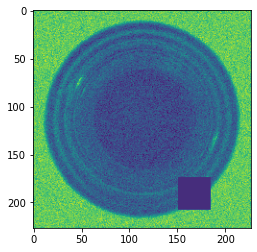

In [15]:
# No handicaps for this version
def handicap(imgs, add_noise=False, apply_cutout=False):
    if add_noise:
        noise = iaa.AdditiveGaussianNoise(scale = 0.1)
        imgs = noise(images = imgs)
        print("Gaussian noise ON")

    if apply_cutout:
        cutout = iaa.Cutout(fill_mode = 'constant', size = 0.15, cval = 0)
        imgs = cutout(images = imgs)
        print("Block cutout ON")

    print("Sample:")
    plt.imshow(imgs[0].reshape(IMG_H, IMG_W))
    return imgs

X_aug_handicapped = handicap(X_aug, add_noise = True, apply_cutout=True)

### Training the model


In [16]:
callbacks = [
    EarlyStopping(patience = 10, monitor = 'val_loss'),
    ModelCheckpoint('Anomaly_Detect_bottle.h5', verbose=1, save_best_only = True)
]

history = model.fit(X_aug_handicapped,X_aug, validation_split = 0.05, batch_size = 8, epochs = 150 ,callbacks=callbacks)

Train on 604 samples, validate on 32 samples
Epoch 1/150
604/604 [==============================] - 19s 31ms/step - loss: 0.5213 - val_loss: 0.4460

Epoch 00001: val_loss improved from inf to 0.44601, saving model to Anomaly_Detect_bottle.h5
Epoch 2/150
604/604 [==============================] - 11s 18ms/step - loss: 0.3920 - val_loss: 0.3070

Epoch 00002: val_loss improved from 0.44601 to 0.30695, saving model to Anomaly_Detect_bottle.h5
Epoch 3/150
604/604 [==============================] - 11s 18ms/step - loss: 0.2348 - val_loss: 0.1918

Epoch 00003: val_loss improved from 0.30695 to 0.19185, saving model to Anomaly_Detect_bottle.h5
Epoch 4/150
604/604 [==============================] - 11s 18ms/step - loss: 0.1885 - val_loss: 0.1761

Epoch 00004: val_loss improved from 0.19185 to 0.17609, saving model to Anomaly_Detect_bottle.h5
Epoch 5/150
604/604 [==============================] - 11s 18ms/step - loss: 0.1799 - val_loss: 0.1719

Epoch 00005: val_loss improved from 0.17609 to 0.17

### Plot training and validation losses

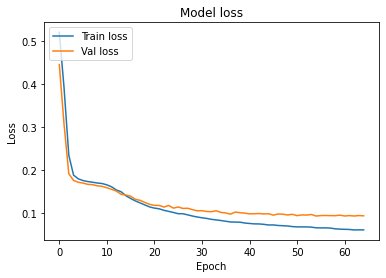

In [17]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train loss', 'Val loss'], loc='upper left')
plt.show()

### Split the test data sets to test and validation 

In [0]:
# shuffle y_bad and mask in same order
np.random.shuffle(y_good)
z = list(zip(y_bad, mask))
np.random.shuffle(z)
y_bad, mask = zip(*z)
y_bad, mask = np.asarray(y_bad), np.asarray(mask)

y_good_valid = y_good[:int(len(y_good)*0.3)]
y_bad_valid = y_bad[:int(len(y_bad)*0.3)]
mask_valid = mask[:int(len(y_bad)*0.3)]

y_good_test = y_good[int(len(y_good)*0.3):]
y_bad_test = y_bad[int(len(y_bad)*0.3):]
mask_test = mask[int(len(y_bad)*0.3):]

### Predict reconstructions of the data 
- `pred_train` : predicted reconstructions of traning iamges
- `pred_valid_good` : predicted reconstructions of non-anomalous validation images
- `pred_valid_bad` : predicted reconstructions of anomalous validation images
- `pred_test_good` : predicted reconstructions of non-anomalous test images
- `pred_test_bad` : predicted reconstructions of anomalous test images

In [19]:
preds_train = model.predict(X, verbose=1)

preds_valid_good = model.predict(y_good_valid, verbose=1)
preds_valid_bad = model.predict(y_bad_valid, verbose=1)

preds_test_good = model.predict(y_good_test, verbose=1)
preds_test_bad = model.predict(y_bad_test, verbose=1)

45/45 [==============================] - 1s 12ms/step


In [0]:
#Helper function for printing two images side-by-side
def print_two_imgs(left_img, right_img,left_label='', right_label=''):
    f = plt.figure()
    left_fig = f.add_subplot(1,2, 1)
    left_fig.set_title(left_label)
    plt.imshow(left_img.reshape(IMG_H, IMG_W))

    right_fig = f.add_subplot(1,2, 2)
    right_fig.set_title(right_label)
    plt.imshow(right_img.reshape(IMG_H, IMG_W))

### Compare original and reconstucted sample image in training set


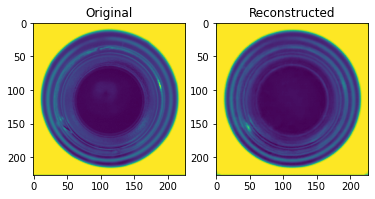

In [21]:
print_two_imgs(X[0],preds_train[0],'Original','Reconstructed')

### Helper functions for visualizing task results

In [0]:
from skimage.measure import compare_ssim

# Generates and returns SSIM diff. score and diff. image between the original and reconstructed
def generate_score_and_mask_ssim(original, reconstructed):
    original=np.mean(original, axis=-1)
    reconstructed = np.mean(reconstructed,axis=-1)

    (ssim_score, ssim_diff_img) = compare_ssim(original, reconstructed, full=True)
    return 1-ssim_score, 1-ssim_diff_img


# Generates and returns L2 diff. score and diff. image between the original and reconstructed
def generate_score_and_mask_l2(original, reconstructed):
    original=np.mean(original, axis=-1)
    reconstructed = np.mean(reconstructed,axis=-1)
    
    L2_diff_img = (original-reconstructed)**2
    L2_score = np.mean(L2_diff_img)
    return L2_score, L2_diff_img


# Helper function for printing subplots of images/mask/diff. images
def compare_img_and_masks(original, reconstructed, ssim_diff_image, l2_diff_image, true_mask = None):
    f = plt.figure(figsize=(15,15))

    ori = f.add_subplot(1,5,1)
    ori.set_title("Original")
    original = original.squeeze()
    plt.imshow(np.stack((original,original,original), axis = 2))

    recon = f.add_subplot(1,5,2)
    recon.set_title("Reconstructed")
    reconstructed = reconstructed.squeeze()
    plt.imshow(np.stack((reconstructed,reconstructed,reconstructed), axis = 2))

    if true_mask is not None:
        t_mask = f.add_subplot(1,5,3)
        t_mask.set_title("Ground-truth Mask")
        plt.imshow(true_mask) 

    ssim_diff = f.add_subplot(1,5,4)
    ssim_diff.set_title("SSIM diff. image")
    plt.imshow(ssim_diff_image)

    l2_diff = f.add_subplot(1,5,5)
    l2_diff.set_title("L2 diff. image")
    plt.imshow(l2_diff_image)

    plt.tight_layout()


# Jointly normalizes data1 and data2 to range of 0-1
def normalize(data1, data2):
    global_max = max(max(data1), max(data2))
    global_min = min(min(data1), min(data2))
    return (data1 - global_min) / (global_max - global_min), (data2 - global_min) / (global_max - global_min)

### Print visuals of each **anomalous** **VALIDATION** data set and collect difference scores

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  


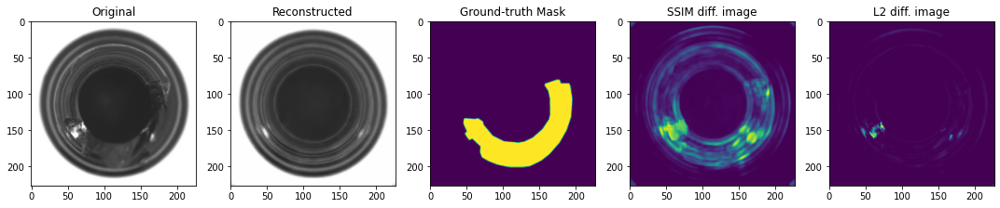

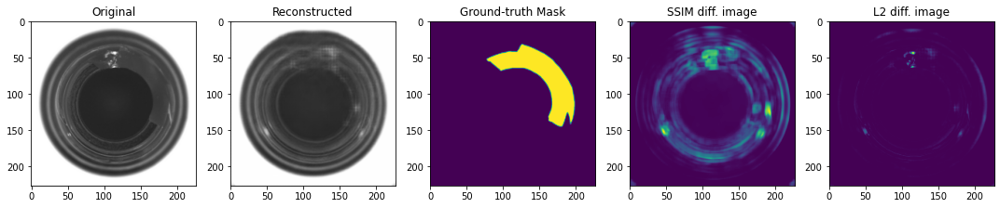

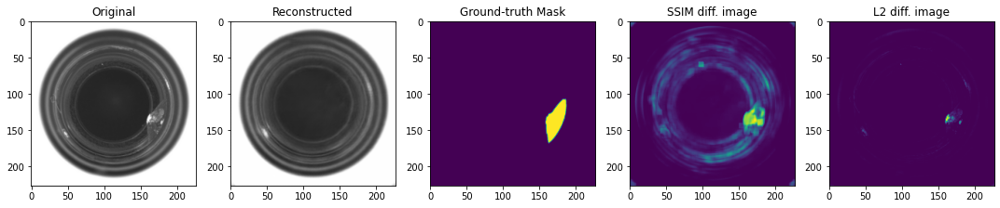

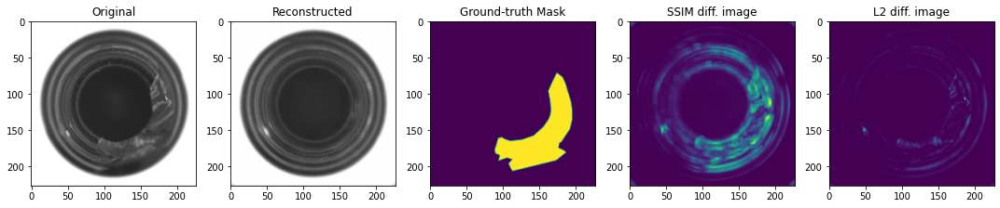

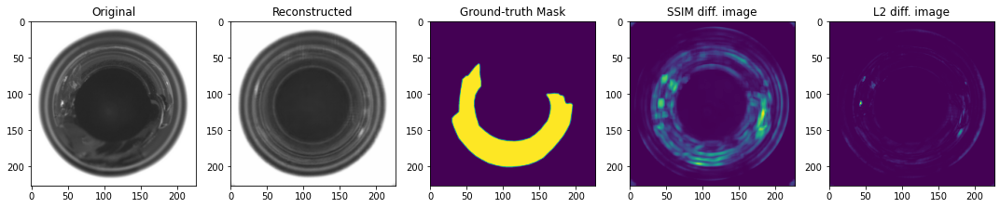

...

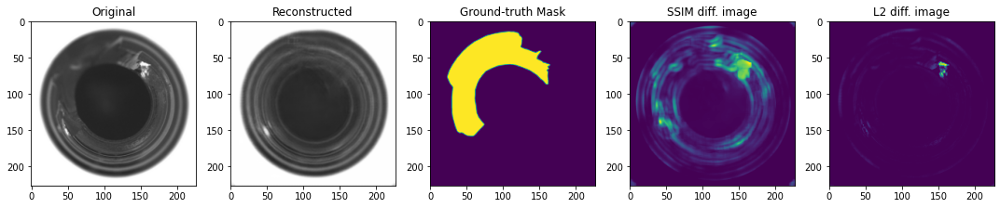

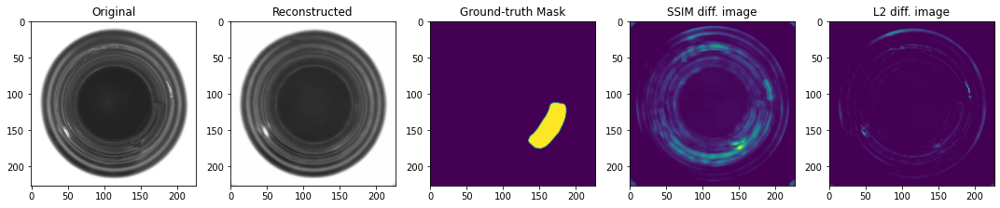

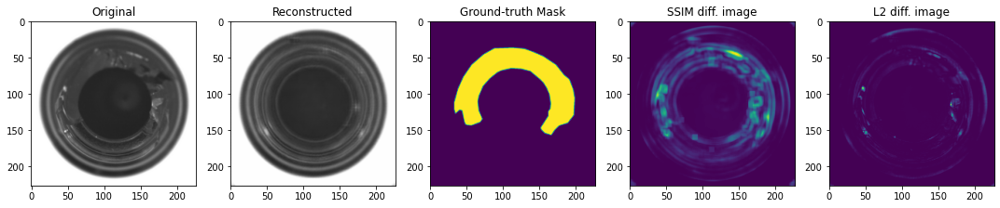

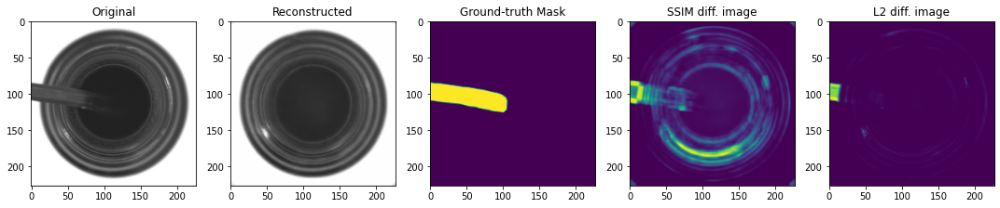

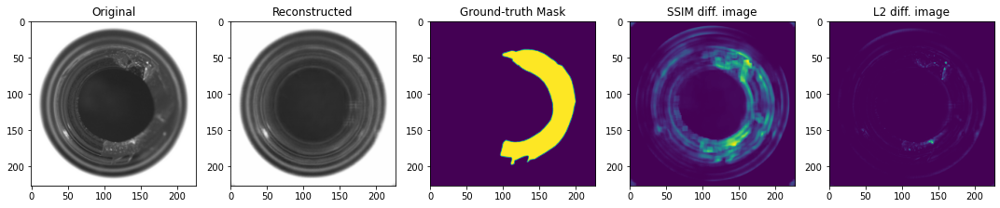

In [23]:
bad_valid_l2_scores = []
bad_valid_ssim_scores = []

for i in range(len(y_bad_valid)):
    original = y_bad_valid[i]
    reconstructed = preds_valid_bad[i]

    ssim_score, ssim_diff = generate_score_and_mask_ssim(original, reconstructed)
    l2_score, l2_diff = generate_score_and_mask_l2(original, reconstructed)

    bad_valid_ssim_scores.append(ssim_score)
    bad_valid_l2_scores.append(l2_score)

    compare_img_and_masks(original, reconstructed, ssim_diff, l2_diff, mask_valid[i])

### Print visuals of each **non-anomalous** **VALIDATION** data set and collect difference scores

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  


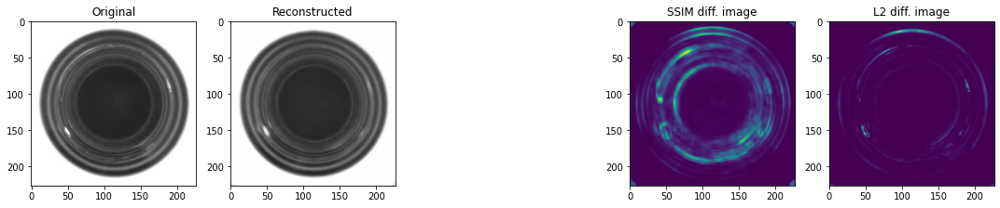

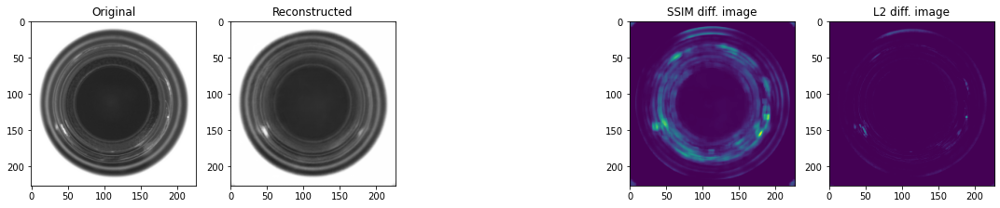

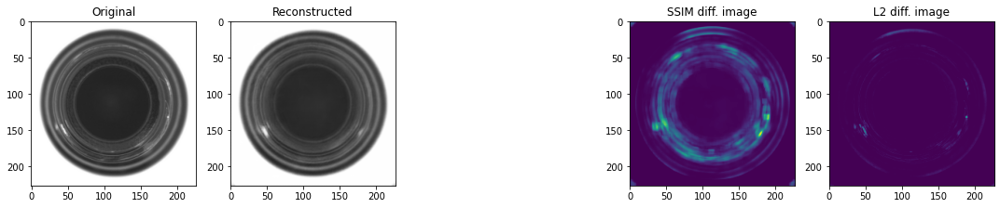

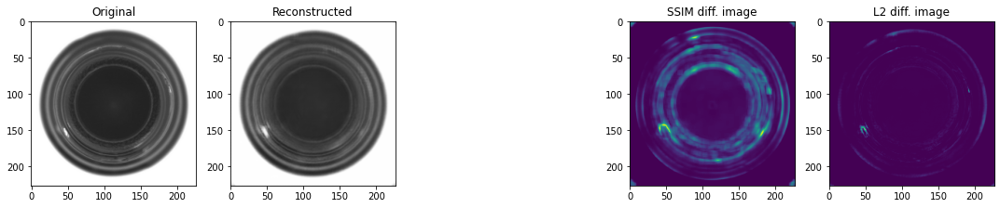

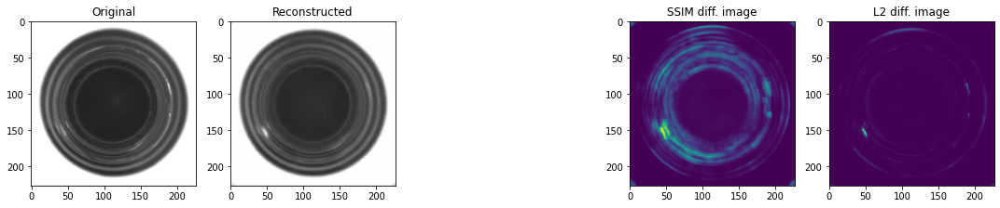

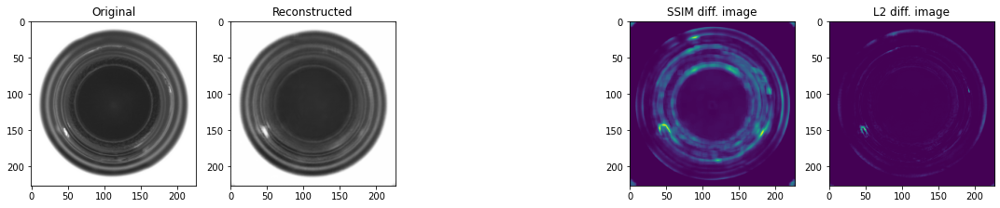

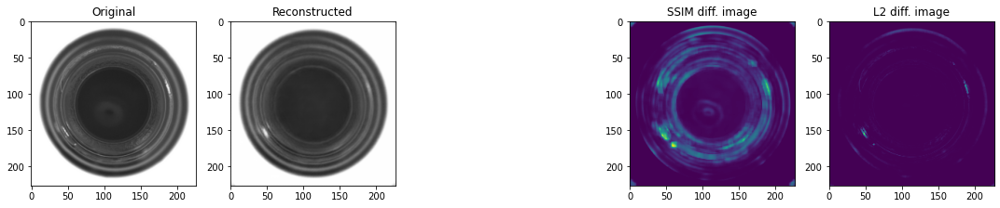

In [24]:
good_valid_l2_scores = []
good_valid_ssim_scores = []

for i in range(len(y_good_valid)):
    original = y_good_valid[i]
    reconstructed = preds_valid_good[i]

    ssim_score, ssim_diff = generate_score_and_mask_ssim(original, reconstructed)
    l2_score, l2_diff = generate_score_and_mask_l2(original, reconstructed)

    good_valid_ssim_scores.append(ssim_score)
    good_valid_l2_scores.append(l2_score)

    compare_img_and_masks(original, reconstructed, ssim_diff, l2_diff, None)

### Normalize the scores of anomlaous and non anomalous validation data set to a range of 0~1

In [0]:
good_valid_l2_scores_norm, bad_valid_l2_scores_norm = normalize(good_valid_l2_scores, bad_valid_l2_scores)
good_valid_ssim_scores_norm, bad_valid_ssim_scores_norm = normalize(good_valid_ssim_scores, bad_valid_ssim_scores)

###Scatter plots of L2 and SSIM reconstruction difference scores of anomalous and non-anomalous validation images 


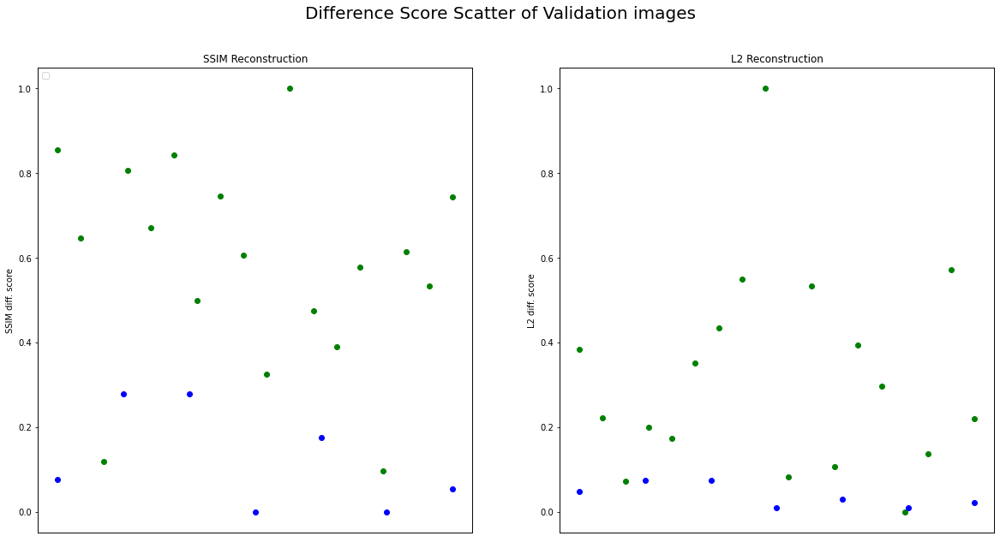

In [26]:
fig, ax= plt.subplots(1,2,figsize=(20,10)) #ssim
fig.suptitle('Difference Score Scatter of Validation images', fontsize=20)

ax[0].set_title("SSIM Reconstruction")
ax[0].set_ylabel('SSIM diff. score')
ax[0].legend(['Train loss', 'Val loss'], loc='upper left')
ax[0].scatter(range(1,len(bad_valid_ssim_scores_norm)+1), bad_valid_ssim_scores_norm, c='green')
ax0 = ax[0].twiny()
ax0.scatter(range(1,len(good_valid_ssim_scores_norm)+1), good_valid_ssim_scores_norm, c='blue')
ax[0].axes.get_xaxis().set_visible(False)
ax0.axes.get_xaxis().set_visible(False)

ax[1].set_title("L2 Reconstruction")
ax[1].set_ylabel('L2 diff. score')
ax[1].scatter(range(1,len(bad_valid_l2_scores_norm)+1), bad_valid_l2_scores_norm, c='green')
ax1 = ax[1].twiny()
ax1.scatter(range(1,len(good_valid_l2_scores_norm)+1), good_valid_l2_scores_norm, c='blue')
ax[1].axes.get_xaxis().set_visible(False)
ax1.axes.get_xaxis().set_visible(False)


### Determine the best thresholds using the difference scores of validation images

In [0]:
#Helper functions for choosing best threshold

def num_errors(good_data, bad_data, t):
    false_positive = np.sum((good_data - t > 0)*1)
    false_negative =  np.sum((bad_data - t < 0)*1)
    return false_positive + false_negative


def best_threshold(good_data, bad_data):
  threshs = np.linspace(0.4,0,100)
  best_threshs = []
  min_error = float('inf')

  for t in threshs:
      error = num_errors(good_data, bad_data, t)
      if error < min_error:
        min_error = error

  for t in threshs:
      if num_errors(good_data, bad_data, t) == min_error:
          best_threshs.append(t)
  
  return np.mean(best_threshs)

In [0]:
ssim_thresh = best_threshold(good_valid_ssim_scores_norm, bad_valid_ssim_scores_norm)
l2_thresh = best_threshold(good_valid_l2_scores_norm, bad_valid_l2_scores_norm)

### Print visuals of each **anomalous** **TEST** data set and collect difference scores

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


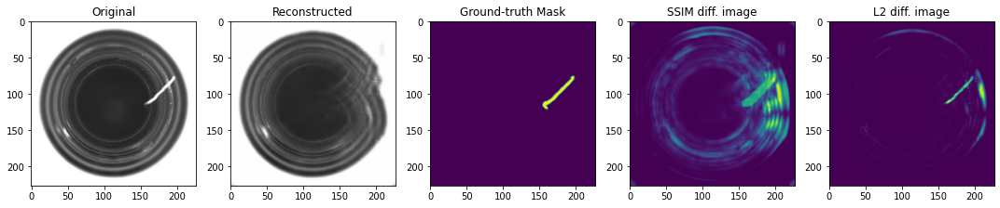

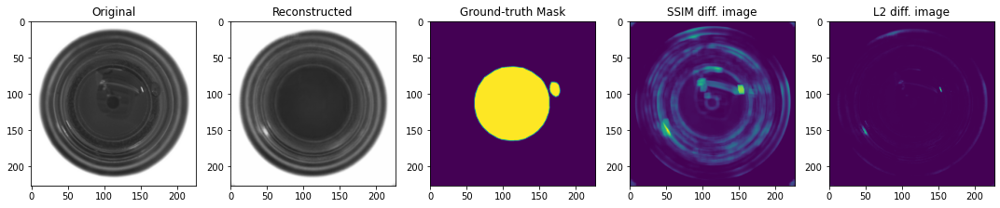

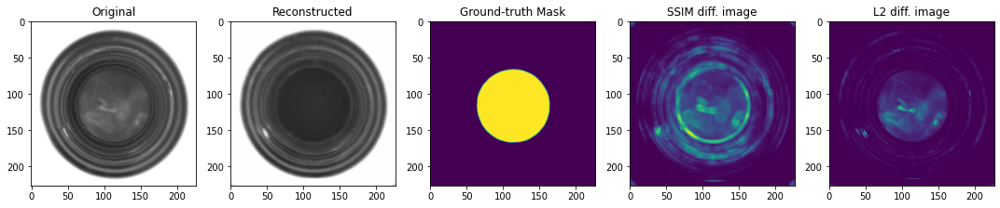

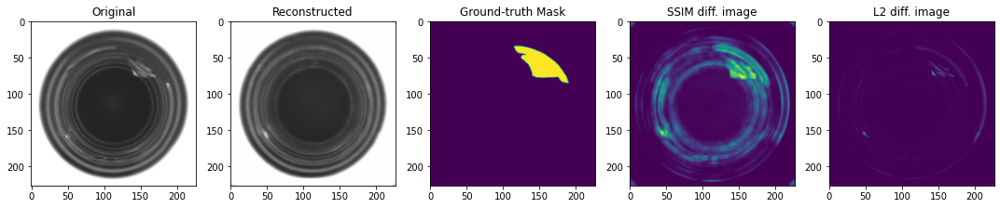

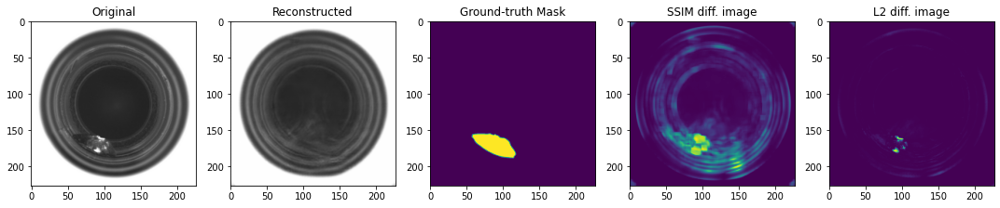

...

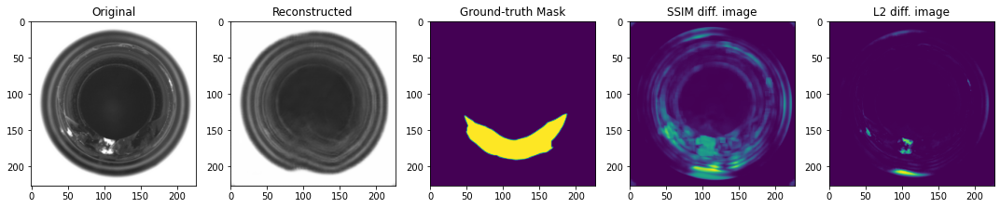

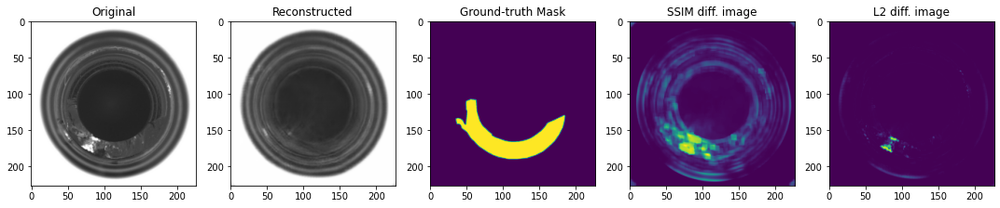

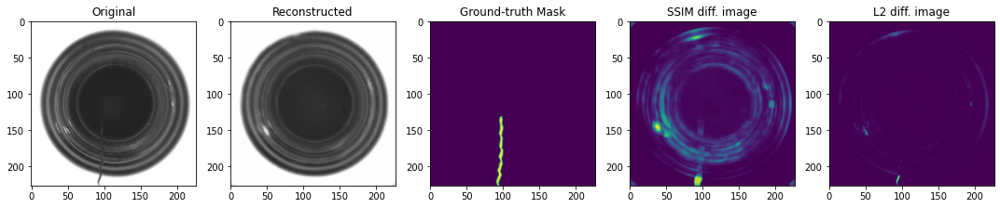

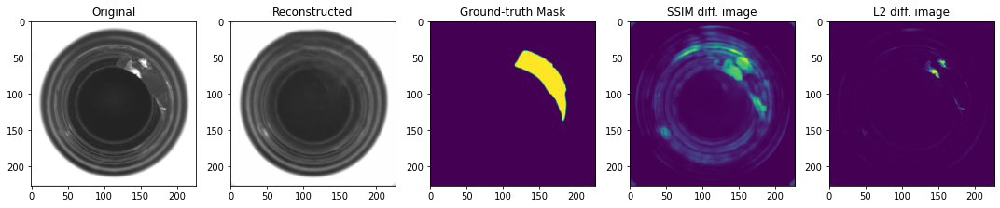

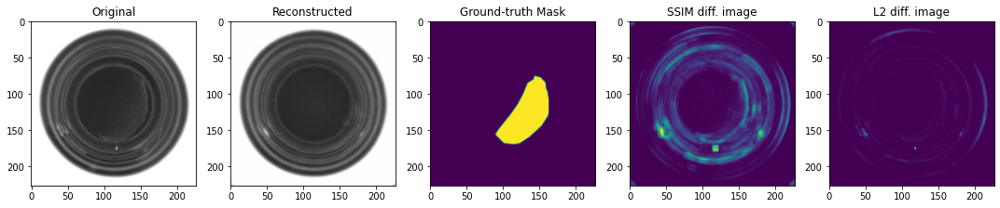

In [29]:
bad_test_l2_scores = []
bad_test_ssim_scores = []

for i in range(len(y_bad_test)):
    original = y_bad_test[i]
    reconstructed = preds_test_bad[i]

    ssim_score, ssim_diff = generate_score_and_mask_ssim(original, reconstructed)
    l2_score, l2_diff = generate_score_and_mask_l2(original, reconstructed)

    bad_test_ssim_scores.append(ssim_score)
    bad_test_l2_scores.append(l2_score)

    compare_img_and_masks(original, reconstructed, ssim_diff, l2_diff, mask_test[i])

### Print visuals of each **non-anomalous** **TEST** data set and collect difference scores

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  


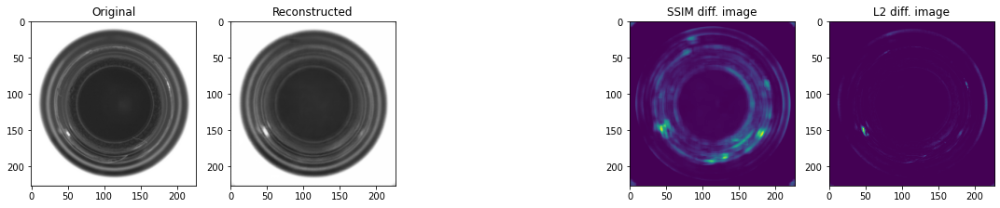

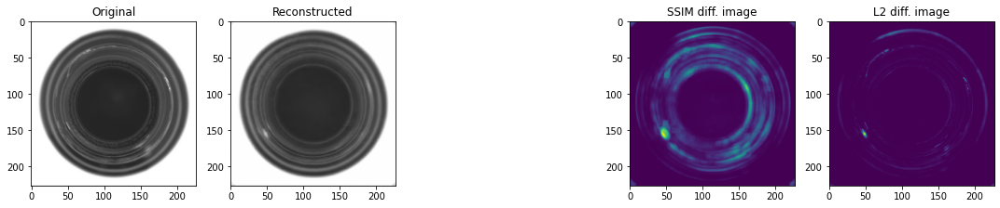

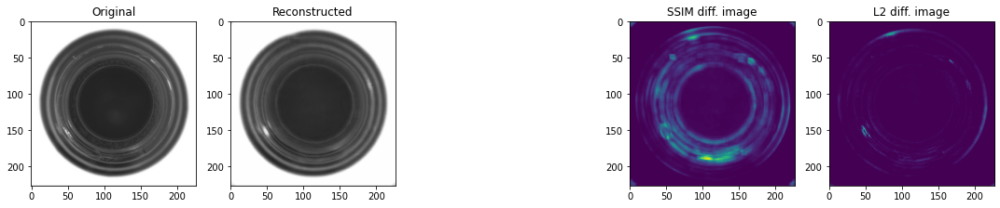

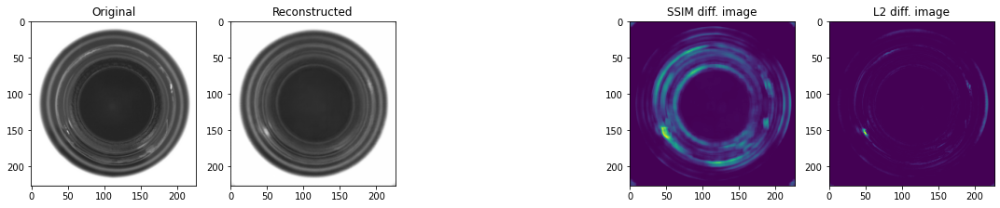

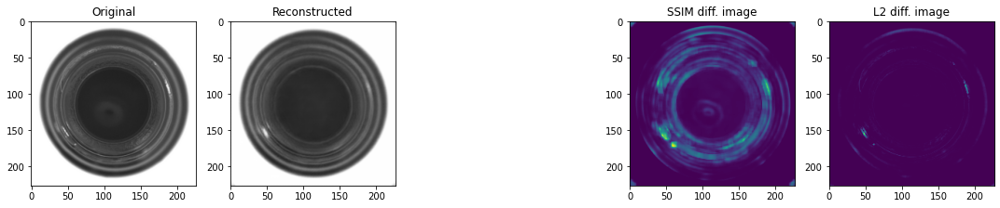

...

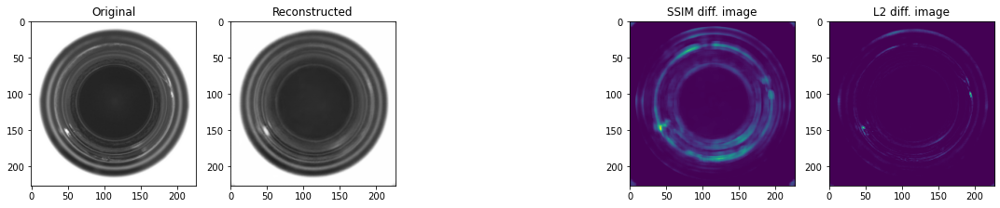

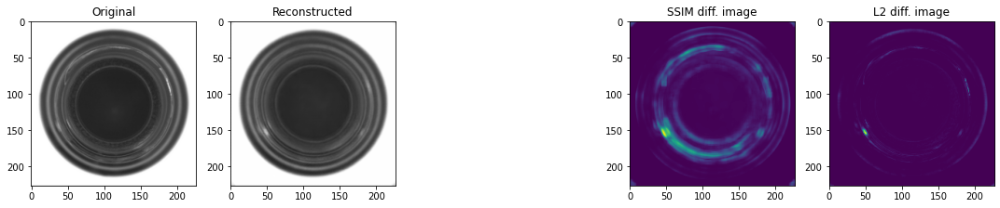

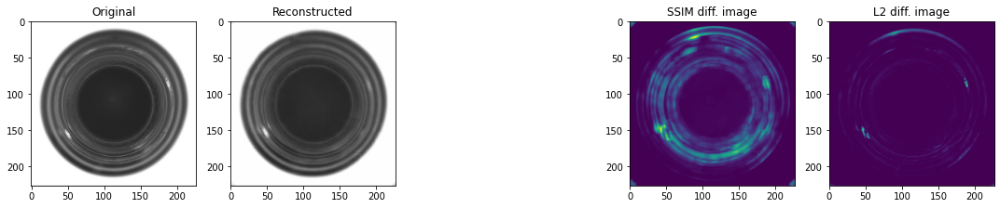

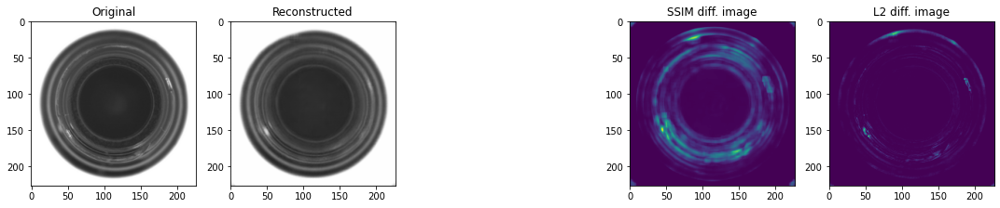

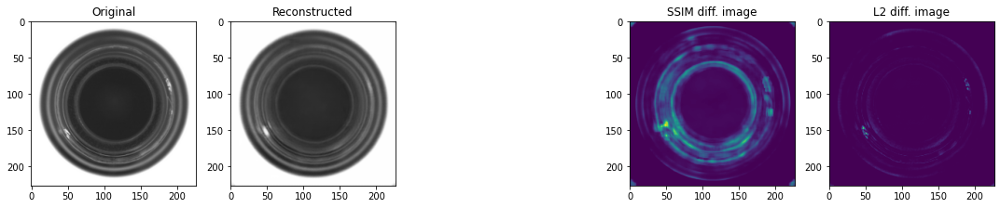

In [30]:
good_test_l2_scores = []
good_test_ssim_scores = []

for i in range(len(y_good_test)):
    original = y_good_test[i]
    reconstructed = preds_test_good[i]

    ssim_score, ssim_diff = generate_score_and_mask_ssim(original, reconstructed)
    l2_score, l2_diff = generate_score_and_mask_l2(original, reconstructed)

    good_test_ssim_scores.append(ssim_score)
    good_test_l2_scores.append(l2_score)

    compare_img_and_masks(original, reconstructed, ssim_diff, l2_diff, None)

### Normalize the scores of anomlaous and non anomalous test data set to a range of 0~1

In [0]:
good_test_l2_scores_norm, bad_test_l2_scores_norm = normalize(good_test_l2_scores, bad_test_l2_scores)
good_test_ssim_scores_norm, bad_test_ssim_scores_norm = normalize(good_test_ssim_scores, bad_test_ssim_scores)

###Scatter plots of L2 and SSIM reconstruction difference scores of anomalous and non-anomalous test images
###Divided by threshold lines determined using validation set images 


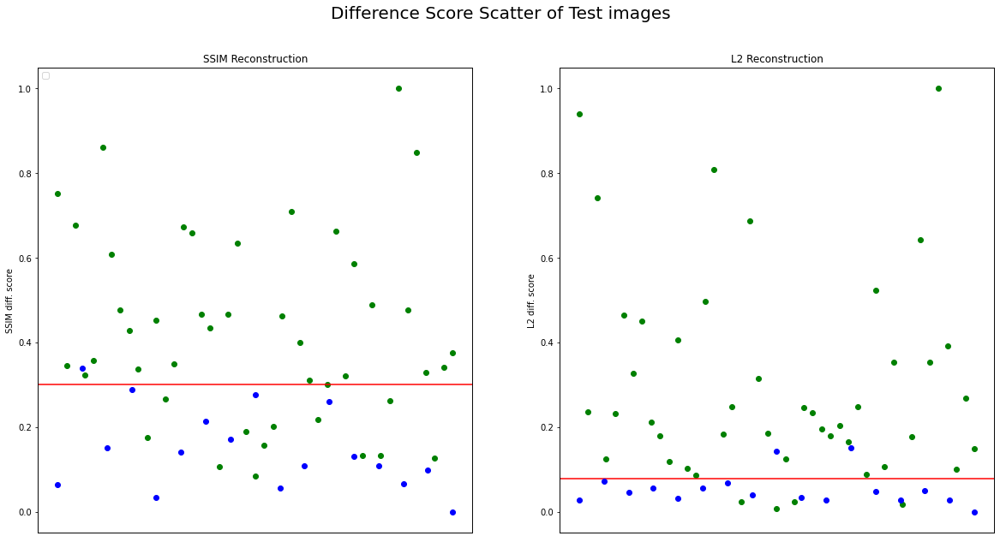

In [32]:
fig_test, ax_test= plt.subplots(1,2,figsize=(20,10)) #ssim
fig_test.suptitle('Difference Score Scatter of Test images', fontsize=20)

ax_test[0].set_title("SSIM Reconstruction")
ax_test[0].set_ylabel('SSIM diff. score')
ax_test[0].legend(['Train loss', 'Val loss'], loc='upper left')
ax_test[0].scatter(range(1,len(bad_test_ssim_scores_norm)+1), bad_test_ssim_scores_norm, c='green')
ax_test0 = ax_test[0].twiny()
ax_test0.scatter(range(1,len(good_test_ssim_scores_norm)+1), good_test_ssim_scores_norm, c='blue')
ax_test[0].axhline(y=ssim_thresh, color='r', linestyle='-')
ax_test[0].axes.get_xaxis().set_visible(False)
ax_test0.axes.get_xaxis().set_visible(False)

ax_test[1].set_title("L2 Reconstruction")
ax_test[1].set_ylabel('L2 diff. score')
ax_test[1].scatter(range(1,len(bad_test_l2_scores_norm)+1), bad_test_l2_scores_norm, c='green')
ax_test1 = ax_test[1].twiny()
ax_test1.scatter(range(1,len(good_test_l2_scores_norm)+1), good_test_l2_scores_norm, c='blue')
ax_test[1].axhline(y=l2_thresh, color='r', linestyle='-')
ax_test[1].axes.get_xaxis().set_visible(False)
ax_test1.axes.get_xaxis().set_visible(False)


### Determine the F1 score of anomaly classification results of testing images

In [33]:
from sklearn.metrics import f1_score

ssim_pred = np.concatenate(((good_test_ssim_scores_norm < ssim_thresh), (bad_test_ssim_scores_norm  < ssim_thresh))) * 1
ssim_true = np.concatenate((np.ones_like(good_test_ssim_scores_norm, dtype=int),np.zeros_like(bad_test_ssim_scores_norm, dtype=int)))

l2_pred = np.concatenate(((good_test_l2_scores_norm < l2_thresh), (bad_test_l2_scores_norm  < l2_thresh))) * 1
l2_true = np.concatenate((np.ones_like(good_test_l2_scores_norm, dtype=int),np.zeros_like(bad_test_l2_scores_norm, dtype=int)))

print("SSIM Difference Metric F1 Score: ", f1_score(ssim_true, ssim_pred))
print("L2 Difference Metric F1 Score: ", f1_score(l2_true, l2_pred))

SSIM Difference Metric F1 Score:  0.6956521739130435
L2 Difference Metric F1 Score:  0.8333333333333333
